# Práctico Deep Learning para Recomendación





**Autor:** RomeroXavier

En esta actividad trabajaremos con un recomendador de ropa basado netamente en las imagenes más similares extrayendo features con redes neuronales convolucionales.



In [ ]:
from keras.applications import vgg16, vgg19, ResNet50
from tensorflow.keras.utils import load_img,img_to_array
from keras.models import Model
from keras.applications.imagenet_utils import preprocess_input

from PIL import Image
import os
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
import pandas as pd

En esta sección se trabajará con modelos pre-entrenados de redes convolucionales (CNN) que extraen caracteristicas visuales de las imagenes.

![Ejemplo de red convolucional](http://dparra.sitios.ing.uc.cl/img/alexnet-ugallery.png)


Para los curiosos se recomienda revisar los siguientes links:

- Artículo: [Understand Deep Residual Networks](https://medium.com/@14prakash/understanding-and-implementing-architectures-of-resnet-and-resnext-for-state-of-the-art-image-cf51669e1624)
- [Keras applications](https://keras.io/applications/)

# descarga de imagenes

In [ ]:
%%capture
!gdown 1iLOeNZw69iyYXa7QS5ZutN7ACUpkbL3x
!unzip images_fashion.zip
!mkdir images
!mv *.png images/

# cargamos la CNN pre-entrenada en ImageNet


In [ ]:
# cargamos el modelo escoger

modelo_escogido = 'vgg19' #@param["vgg16", "vgg19"]

if modelo_escogido == 'vgg16':
  # cargar modelo
  vgg_model = vgg16.VGG16(weights='imagenet')
  # quitar la capa de clasificacion
  feat_extractor = Model(inputs=vgg_model.input, outputs=vgg_model.get_layer("fc2").output)
  # vemos resumen de la arquitectura del modelo
  feat_extractor.summary()

elif modelo_escogido == 'vgg19':
  # cargar modelo
  vgg19_model = vgg19.VGG19(weights='imagenet')
  # quitar la capa de clasificacion
  feat_extractor = Model(inputs=vgg19_model.input, outputs=vgg19_model.get_layer("fc2").output)
  # vemos resumen de la arquitectura del modelo
  feat_extractor.summary()



574710816/574710816 [==============================] - 25s 0us/step
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                           

## procesamiento de imágenes para dárselas como input a la CNN

In [ ]:
imgs_path = "images/" # ruta
imgs_model_width, imgs_model_height = 224, 224 # tamaño de las imagenes 224x224 pixeles

nb_closest_images = 5 # cantidad de imagenes similares a recomendar

In [ ]:
files = [imgs_path + x for x in os.listdir(imgs_path) if "png" in x]
print("total de imagenes:",len(files))

total de imagenes: 2184


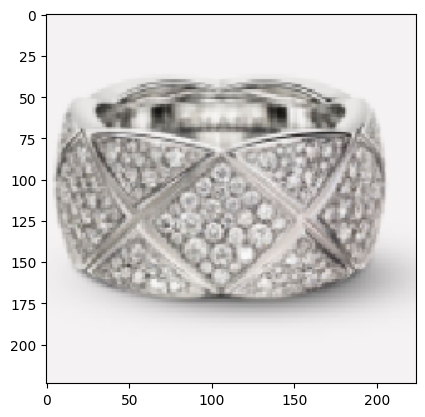

In [ ]:
# vemos imagen aleatoria
import random

idx = random.randint(0, len(files))
original = load_img(files[idx], target_size=(imgs_model_width, imgs_model_height))
plt.imshow(original)
plt.show()
print("image cargada exitosamente!")

In [ ]:
# convertir PIL image a numpy array
numpy_image = img_to_array(original)

# convertir imagen a batch de imagenes para entrenamiento más eficiente
image_batch = np.expand_dims(numpy_image, axis=0)
print('image batch size', image_batch.shape)

# preparamos la imagen para la VGG16
processed_image = preprocess_input(image_batch.copy())

image cargada exitosamente!
image batch size (1, 224, 224, 3)


In [ ]:
# obtenemos los features (embeddings) de las imagenes pasandolas por la VGG16
img_features = feat_extractor.predict(processed_image)

print("features successfully extracted!")
print("number of image features:",img_features.size)
img_features

1/1 [==============================] - 8s 8s/step
features successfully extracted!
number of image features: 4096


array([[0.        , 3.3459616 , 0.41046897, ..., 2.4510243 , 2.6083474 ,
        2.3026485 ]], dtype=float32)

In [ ]:
# repetimos el mismo proceso para todas las imagenes y guardamos los batch en una lista para entregarselos procesados a la VGG16
importedImages = []

for f in files:
    filename = f
    original = load_img(filename, target_size=(224, 224))
    numpy_image = img_to_array(original)
    image_batch = np.expand_dims(numpy_image, axis=0)

    importedImages.append(image_batch)

images = np.vstack(importedImages)

processed_imgs = preprocess_input(images.copy())

In [ ]:
# obtenemos los features para cada imagen con la CNN
imgs_features = feat_extractor.predict(processed_imgs)

print("features extraidos exitosamente!")
imgs_features.shape

69/69 [==============================] - 15s 155ms/step
features extraidos exitosamente!


(2184, 4096)

In [ ]:
# computa similaridad coseno entre los features de las imagenes
cosSimilarities = cosine_similarity(imgs_features)

# guardamos los resultados en un dataframe
cos_similarities_df = pd.DataFrame(cosSimilarities, columns=files, index=files)
cos_similarities_df #.head()

,images/1_2_027.png,images/1_0_040.png,images/4_2_066.png,images/4_1_042.png,images/4_2_049.png,images/6_3_021.png,images/5_0_049.png,images/4_7_031.png,images/2_2_066.png,images/4_2_057.png,...,images/0_8_018.png,images/1_1_026.png,images/4_2_024.png,images/5_0_028.png,images/3_5_001.png,images/4_4_003.png,images/4_0_034.png,images/1_4_018.png,images/4_5_018.png,images/0_1_009.png
images/1_2_027.png,1.000000,0.287097,0.494075,0.198061,0.632730,0.278746,0.218558,0.306661,0.490391,0.484599,...,0.345822,0.202794,0.472828,0.293942,0.427383,0.467565,0.328309,0.403416,0.334143,0.209237
images/1_0_040.png,0.287097,1.000000,0.271832,0.355015,0.280626,0.345010,0.373245,0.462372,0.392936,0.253157,...,0.374267,0.280588,0.410292,0.507233,0.375754,0.376295,0.431293,0.314008,0.274051,0.295886
images/4_2_066.png,0.494075,0.271832,1.000000,0.196564,0.515383,0.314526,0.249705,0.245477,0.424920,0.477177,...,0.261112,0.208896,0.545608,0.251415,0.313511,0.262442,0.208851,0.329507,0.247844,0.172024
images/4_1_042.png,0.198061,0.355015,0.196564,1.000000,0.180559,0.323322,0.166241,0.254767,0.261646,0.229011,...,0.221524,0.508006,0.282032,0.207910,0.251775,0.311491,0.200657,0.263694,0.210237,0.531709
images/4_2_049.png,0.632730,0.280626,0.515383,0.180559,1.000000,0.349382,0.246517,0.294573,0.513321,0.495387,...,0.205452,0.234360,0.537669,0.225238,0.309778,0.359778,0.277423,0.390582,0.286018,0.170565
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
images/4_4_003.png,0.467565,0.376295,0.262442,0.311491,0.359778,0.256642,0.215518,0.381562,0.381298,0.308109,...,0.349330,0.199343,0.320716,0.283115,0.377313,1.000000,0.386278,0.631033,0.410180,0.258059
images/4_0_034.png,0.328309,0.431293,0.208851,0.200657,0.277423,0.176494,0.277005,0.412135,0.180094,0.155159,...,0.446074,0.143810,0.236976,0.699228,0.292978,0.386278,1.000000,0.258573,0.264716,0.296719
images/1_4_018.png,0.403416,0.314008,0.329507,0.263694,0.390582,0.251875,0.225887,0.275212,0.421703,0.327407,...,0.249503,0.168855,0.330792,0.177396,0.299462,0.631033,0.258573,1.000000,0.270057,0.175355
images/4_5_018.png,0.334143,0.274051,0.247844,0.210237,0.286018,0.193767,0.177040,0.526774,0.358365,0.323740,...,0.277514,0.202846,0.326828,0.326870,0.382514,0.410180,0.264716,0.270057,1.000000,0.210507


In [ ]:
# esta funcion recupera las imagenes más similares dada una imagen entregada por el usuario
def retrieve_most_similar_products(given_img):

    print("-----------------------------------------------------------------------")
    print("producto escogido:")

    original = load_img(given_img, target_size=(imgs_model_width, imgs_model_height))
    plt.imshow(original)
    plt.show()

    print("-----------------------------------------------------------------------")
    print("productos más similares:")

    closest_imgs = cos_similarities_df[given_img].sort_values(ascending=False)[1:nb_closest_images+1].index
    closest_imgs_scores = cos_similarities_df[given_img].sort_values(ascending=False)[1:nb_closest_images+1]

    for i in range(0,len(closest_imgs)):
        original = load_img(closest_imgs[i], target_size=(imgs_model_width, imgs_model_height))
        plt.imshow(original)
        plt.show()
        print("score de similaridad : ",closest_imgs_scores[i])

1105
-----------------------------------------------------------------------
producto escogido:


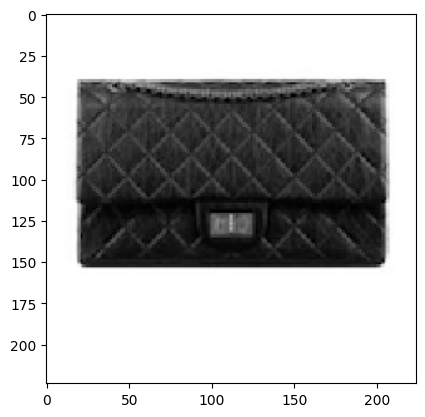

-----------------------------------------------------------------------
productos más similares:


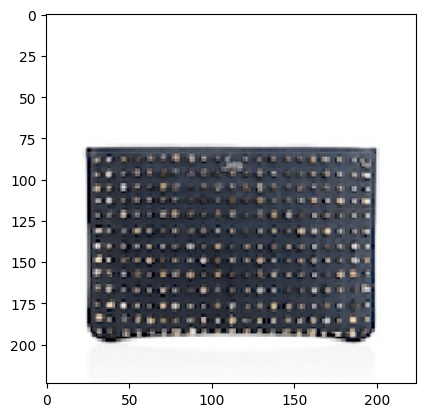

score de similaridad :  0.7219149


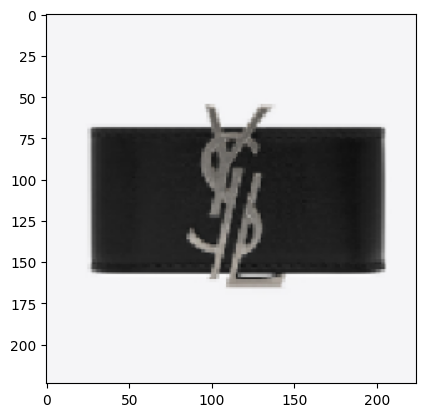

score de similaridad :  0.70289767


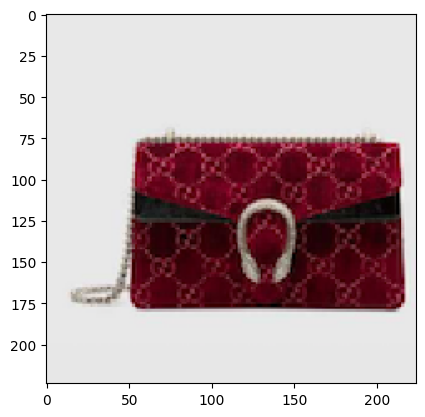

score de similaridad :  0.69535655


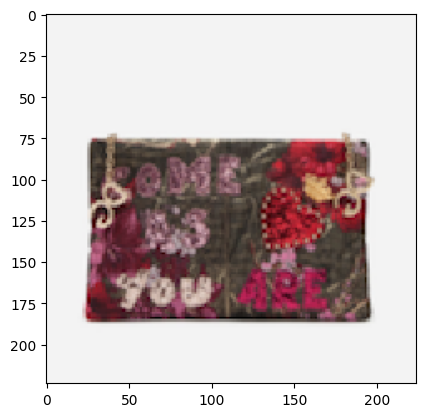

score de similaridad :  0.69482857


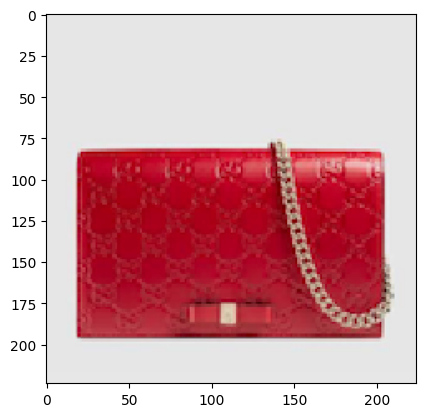

score de similaridad :  0.6896705


In [ ]:
idx = random.randint(0, len(files))
print(idx)
retrieve_most_similar_products(files[idx])

# ACTIVIDAD

1. Mostrar 2 ejemplos de búsqueda de imagenes similares utilizando ambas arquitecturas (VGG16 y VGG19) e imprimir los resultados. (3 ptos)

2. ¿Cuál de las dos arquitecturas (VGG16 o VGG19) tiene más parámetros entrenables después de quitar la última capa de clasificación?. Justifique indicando la cantidad de parámetros de cada una. (2 ptos)


Actividad 1.
Aqui trabajaremos con un set de imagenes acerca de cuadros.

In [ ]:
import altair as alt
import requests
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
from keras.applications import vgg16, vgg19, ResNet50
from tensorflow.keras.utils import load_img,img_to_array
from keras.models import Model
from keras.applications.imagenet_utils import preprocess_input
from PIL import Image
import os
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
import pandas as pd
from tensorflow.keras import datasets, layers, models
import tensorflow as tf
import tensorflow
from tensorflow import keras
from keras.layers import Dense


In [ ]:
# cargamos el modelo escoger

modelo_escogido = 'vgg19' #@param["vgg16", "vgg19"]

if modelo_escogido == 'vgg16':
  # cargar modelo
  vgg_model = vgg16.VGG16(weights='imagenet')
  # quitar la capa de clasificacion
  feat_extractor = Model(inputs=vgg_model.input, outputs=vgg_model.get_layer("fc2").output)
  # vemos resumen de la arquitectura del modelo
  feat_extractor.summary()

elif modelo_escogido == 'vgg19':
  # cargar modelo
  vgg19_model = vgg19.VGG19(weights='imagenet')
  # quitar la capa de clasificacion
  feat_extractor = Model(inputs=vgg19_model.input, outputs=vgg19_model.get_layer("fc2").output)
  # vemos resumen de la arquitectura del modelo
  feat_extractor.summary()

574710816/574710816 [==============================] - 15s 0us/step
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                           

In [ ]:
def download_file_without_authenticate(id, destination):
    def get_confirm_token(response):
        for key, value in response.cookies.items():
            if key.startswith("download_warning"):
                return value

    URL = "https://docs.google.com/uc?export=download"
    response = requests.get(URL, params={"id": id, "confirm": 1}, stream=True)

    CHUNK_SIZE = 32768
    with open(destination, "wb") as f:
        for i, chunk in enumerate(response.iter_content(CHUNK_SIZE)):
            if chunk:  # filter out keep-alive new chunks
                f.write(chunk)

    return None

In [ ]:
from IPython.display import clear_output

download_file_without_authenticate("1LRxdcv6bwPLYFcHe1uYYUlJVsPk9760B", "surdoc.zip")

!unzip -o surdoc

clear_output() # Limpiar ventana para que no se vea despues.
!ls

features  images  __MACOSX  sample_data  surdoc.zip


In [ ]:
import os
import random
import cv2


images = []
dataset = []
images_path = random.sample(os.listdir("images"), 100)
for image in images_path:
  if image.endswith(".jpg"):
    image_file = cv2.imread(os.path.join("images", image))
    resized = cv2.resize(image_file, (20, 30), interpolation = cv2.INTER_AREA)
    images.append(resized)

    npy = image[:-3] + "npy"
    dataset.append(np.load(os.path.join("features", npy)))

images_surdoc = np.array(images)
dataset_surdoc = np.array(dataset)

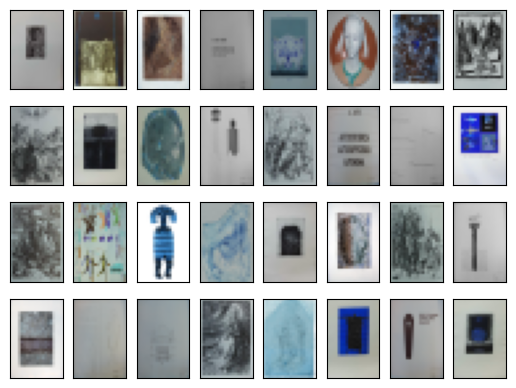

In [ ]:
fig, ax = plt.subplots(4, 8, subplot_kw=dict(xticks=[], yticks=[]))
for i, axi in enumerate(ax.flat):
    axi.imshow(images_surdoc[i])

In [ ]:
imgs_path = "images/" # ruta

In [ ]:
files = [imgs_path + x for x in os.listdir(imgs_path) if "jpg" in x]
print("total de imagenes:",len(files))

total de imagenes: 396


In [ ]:
imgs_model_width, imgs_model_height = 224, 224 # tamaño de las imagenes 224x224 pixeles

nb_closest_images = 5

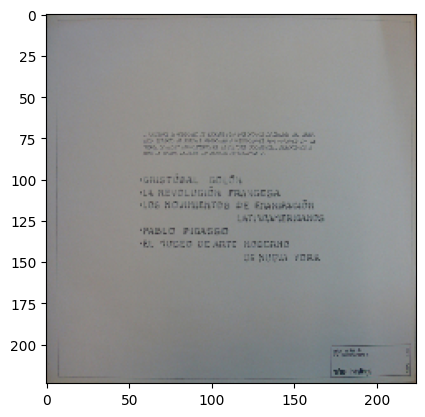

image cargada exitosamente!


In [ ]:
#Imagen aleatoria
import random

idx = random.randint(0, len(files))
original = load_img(files[idx], target_size=(imgs_model_width, imgs_model_height))
plt.imshow(original)
plt.show()
print("image cargada exitosamente!")

In [ ]:
# convertir PIL image a numpy array
numpy_image = img_to_array(original)

# convertir imagen a batch de imagenes para entrenamiento más eficiente
image_batch = np.expand_dims(numpy_image, axis=0)
print('image batch size', image_batch.shape)

# preparamos la imagen para la VGG16
processed_image = preprocess_input(image_batch.copy())

image batch size (1, 224, 224, 3)


In [ ]:
# obtenemos los features (embeddings) de las imagenes pasandolas por la VGG16
img_features = feat_extractor.predict(processed_image)

print("features successfully extracted!")
print("number of image features:",img_features.size)
img_features

1/1 [==============================] - 8s 8s/step
features successfully extracted!
number of image features: 4096


array([[0.77087533, 0.28489843, 0.35453814, ..., 0.        , 0.        ,
        0.        ]], dtype=float32)

In [ ]:
# repetimos el mismo proceso para todas las imagenes y guardamos los batch en una lista para entregarselos procesados a la VGG16
importedImages = []

for f in files:
    filename = f
    original = load_img(filename, target_size=(224, 224))
    numpy_image = img_to_array(original)
    image_batch = np.expand_dims(numpy_image, axis=0)

    importedImages.append(image_batch)

images = np.vstack(importedImages)

processed_imgs = preprocess_input(images.copy())

In [ ]:
# obtenemos los features para cada imagen con la CNN
imgs_features = feat_extractor.predict(processed_imgs)

print("features extraidos exitosamente!")
imgs_features.shape

13/13 [==============================] - 7s 273ms/step
features extraidos exitosamente!


(396, 4096)

In [ ]:
# computa similaridad coseno entre los features de las imagenes
cosSimilarities = cosine_similarity(imgs_features)

# guardamos los resultados en un dataframe
cos_similarities_df = pd.DataFrame(cosSimilarities, columns=files, index=files)
cos_similarities_df #.head()

,images/4647_1.jpg,images/4886_1.jpg,images/4939_1.jpg,images/3934_1.jpg,images/4407_1.jpg,images/4496_1.jpg,images/4433_1.jpg,images/4754_1.jpg,images/4522_1.jpg,images/4461_1.jpg,...,images/4482_1.jpg,images/4228_1.jpg,images/4299_1.jpg,images/3959_1.jpg,images/4575_1.jpg,images/4863_1.jpg,images/4704_1.jpg,images/4096_1.jpg,images/3936_1.jpg,images/3941_1.jpg
images/4647_1.jpg,1.000000,0.414880,0.260797,0.310435,0.378686,0.384998,0.435417,0.494633,0.296772,0.355227,...,0.426357,0.421085,0.345397,0.402945,0.349995,0.283102,0.486074,0.307275,0.333825,0.487498
images/4886_1.jpg,0.414880,1.000000,0.334994,0.306268,0.455203,0.409947,0.500672,0.473999,0.450865,0.361072,...,0.655517,0.574811,0.366104,0.467173,0.394903,0.416930,0.400230,0.403996,0.370865,0.418835
images/4939_1.jpg,0.260797,0.334994,1.000000,0.492015,0.511788,0.374226,0.513967,0.294319,0.227188,0.422697,...,0.401465,0.256821,0.478487,0.425341,0.360884,0.269350,0.346655,0.307439,0.434907,0.324980
images/3934_1.jpg,0.310435,0.306268,0.492015,1.000000,0.449087,0.367016,0.432913,0.303335,0.339434,0.351057,...,0.388485,0.302327,0.399265,0.344234,0.637089,0.264936,0.414392,0.441802,0.497120,0.363338
images/4407_1.jpg,0.378686,0.455203,0.511788,0.449087,1.000000,0.462401,0.713906,0.437244,0.322605,0.673369,...,0.512641,0.389197,0.466896,0.492935,0.436521,0.368127,0.364539,0.338661,0.348854,0.351155
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
images/4863_1.jpg,0.283102,0.416930,0.269350,0.264936,0.368127,0.529171,0.384115,0.273691,0.261153,0.318882,...,0.414585,0.439127,0.292483,0.340652,0.362134,1.000000,0.323242,0.195004,0.271461,0.297312
images/4704_1.jpg,0.486074,0.400230,0.346655,0.414392,0.364539,0.422456,0.442297,0.350200,0.392657,0.303365,...,0.356672,0.444998,0.443783,0.484153,0.348033,0.323242,1.000000,0.420931,0.456776,0.610445
images/4096_1.jpg,0.307275,0.403996,0.307439,0.441802,0.338661,0.286993,0.489368,0.401624,0.610854,0.282104,...,0.350318,0.418607,0.411920,0.426727,0.368586,0.195004,0.420931,1.000000,0.414447,0.473928
images/3936_1.jpg,0.333825,0.370865,0.434907,0.497120,0.348854,0.397299,0.392063,0.379624,0.271764,0.305276,...,0.382041,0.276302,0.487902,0.445215,0.411905,0.271461,0.456776,0.414447,1.000000,0.430751


In [ ]:
# esta funcion recupera las imagenes más similares dada una imagen entregada por el usuario
def retrieve_most_similar_products(given_img):

    print("-----------------------------------------------------------------------")
    print("producto escogido:")

    original = load_img(given_img, target_size=(imgs_model_width, imgs_model_height))
    plt.imshow(original)
    plt.show()

    print("-----------------------------------------------------------------------")
    print("productos más similares:")

    closest_imgs = cos_similarities_df[given_img].sort_values(ascending=False)[1:nb_closest_images+1].index
    closest_imgs_scores = cos_similarities_df[given_img].sort_values(ascending=False)[1:nb_closest_images+1]

    for i in range(0,len(closest_imgs)):
        original = load_img(closest_imgs[i], target_size=(imgs_model_width, imgs_model_height))
        plt.imshow(original)
        plt.show()
        print("score de similaridad : ",closest_imgs_scores[i])

286
-----------------------------------------------------------------------
producto escogido:


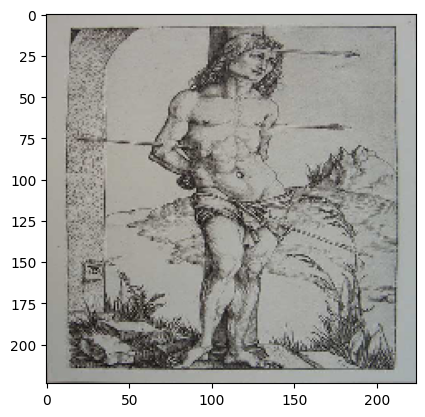

-----------------------------------------------------------------------
productos más similares:


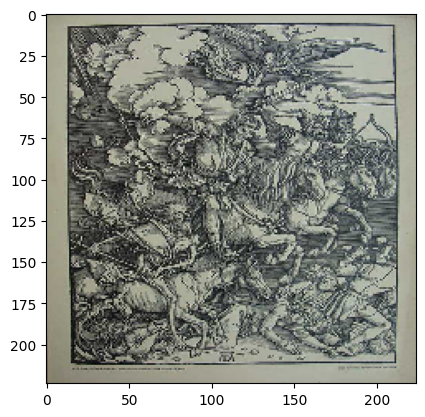

score de similaridad :  0.7689247


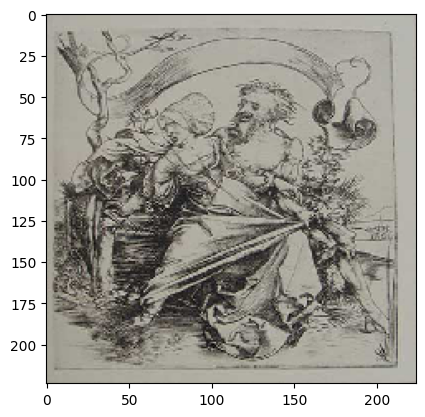

score de similaridad :  0.75631005


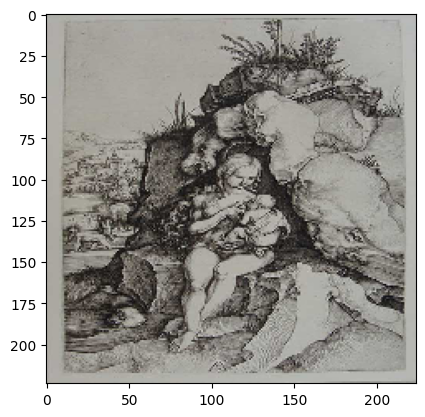

score de similaridad :  0.75215495


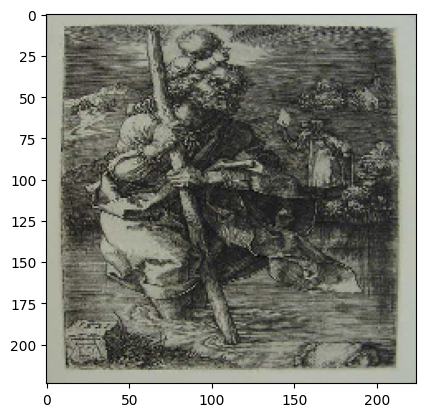

score de similaridad :  0.74184185


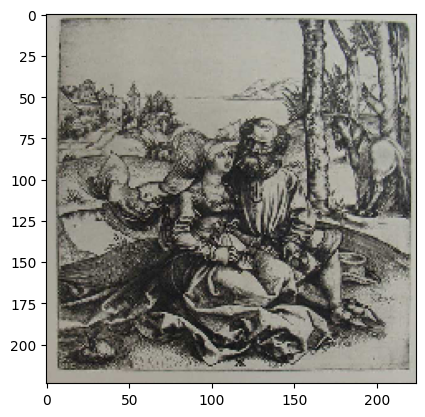

score de similaridad :  0.7115409


In [ ]:
idx = random.randint(0, len(files))
print(idx)
retrieve_most_similar_products(files[idx])

Ahora repetiremos el ejercicio trabajando con la arquitectira VGG16

In [ ]:
# Modelo VGG16

modelo_escogido = 'vgg16' #@param["vgg16", "vgg19"]

if modelo_escogido == 'vgg16':
  # cargar modelo
  vgg_model = vgg16.VGG16(weights='imagenet')
  # quitar la capa de clasificacion
  feat_extractor = Model(inputs=vgg_model.input, outputs=vgg_model.get_layer("fc2").output)
  # vemos resumen de la arquitectura del modelo
  feat_extractor.summary()

elif modelo_escogido == 'vgg19':
  # cargar modelo
  vgg19_model = vgg19.VGG19(weights='imagenet')
  # quitar la capa de clasificacion
  feat_extractor = Model(inputs=vgg19_model.input, outputs=vgg19_model.get_layer("fc2").output)
  # vemos resumen de la arquitectura del modelo
  feat_extractor.summary()



553467096/553467096 [==============================] - 17s 0us/step
Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                         

In [ ]:
imgs_path = "images/" # ruta
imgs_model_width, imgs_model_height = 224, 224 # tamaño de las imagenes 224x224 pixeles

nb_closest_images = 5 # cantidad de imagenes similares a recomendar

In [ ]:
files = [imgs_path + x for x in os.listdir(imgs_path) if "jpg" in x]
print("total de imagenes:",len(files))

total de imagenes: 396


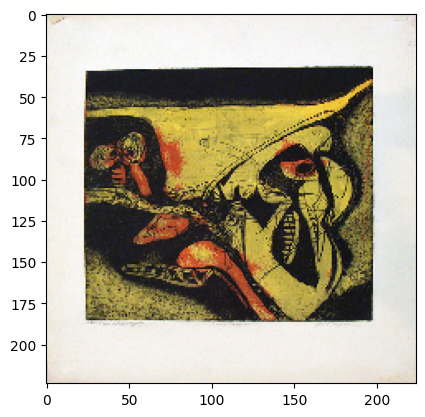

image cargada exitosamente!


In [ ]:
# vemos imagen aleatoria
import random

idx = random.randint(0, len(files))
original = load_img(files[idx], target_size=(imgs_model_width, imgs_model_height))
plt.imshow(original)
plt.show()
print("image cargada exitosamente!")

In [ ]:
# convertir PIL image a numpy array
numpy_image = img_to_array(original)

# convertir imagen a batch de imagenes para entrenamiento más eficiente
image_batch = np.expand_dims(numpy_image, axis=0)
print('image batch size', image_batch.shape)

# preparamos la imagen para la VGG16
processed_image = preprocess_input(image_batch.copy())

image batch size (1, 224, 224, 3)


In [ ]:
# obtenemos los features (embeddings) de las imagenes pasandolas por la VGG16
img_features = feat_extractor.predict(processed_image)

print("features successfully extracted!")
print("number of image features:",img_features.size)
img_features

1/1 [==============================] - 0s 169ms/step
features successfully extracted!
number of image features: 4096


array([[0.       , 0.       , 0.       , ..., 0.       , 0.       ,
        1.0400307]], dtype=float32)

In [ ]:
# repetimos el mismo proceso para todas las imagenes y guardamos los batch en una lista para entregarselos procesados a la VGG16
importedImages = []

for f in files:
    filename = f
    original = load_img(filename, target_size=(224, 224))
    numpy_image = img_to_array(original)
    image_batch = np.expand_dims(numpy_image, axis=0)

    importedImages.append(image_batch)

images = np.vstack(importedImages)

processed_imgs = preprocess_input(images.copy())

In [ ]:
# obtenemos los features para cada imagen con la CNN
imgs_features = feat_extractor.predict(processed_imgs)

print("features extraidos exitosamente!")
imgs_features.shape

13/13 [==============================] - 1s 116ms/step
features extraidos exitosamente!


(396, 4096)

In [ ]:
# computa similaridad coseno entre los features de las imagenes
cosSimilarities = cosine_similarity(imgs_features)

# guardamos los resultados en un dataframe
cos_similarities_df = pd.DataFrame(cosSimilarities, columns=files, index=files)
cos_similarities_df #.head()

,images/4647_1.jpg,images/4886_1.jpg,images/4939_1.jpg,images/3934_1.jpg,images/4407_1.jpg,images/4496_1.jpg,images/4433_1.jpg,images/4754_1.jpg,images/4522_1.jpg,images/4461_1.jpg,...,images/4482_1.jpg,images/4228_1.jpg,images/4299_1.jpg,images/3959_1.jpg,images/4575_1.jpg,images/4863_1.jpg,images/4704_1.jpg,images/4096_1.jpg,images/3936_1.jpg,images/3941_1.jpg
images/4647_1.jpg,1.000000,0.449131,0.220522,0.358212,0.330532,0.348777,0.367788,0.465536,0.340296,0.284292,...,0.358288,0.451320,0.298499,0.373381,0.382413,0.297888,0.467446,0.418970,0.377904,0.495632
images/4886_1.jpg,0.449131,1.000000,0.365040,0.381113,0.433928,0.463488,0.517729,0.503034,0.487111,0.406661,...,0.570184,0.606019,0.416011,0.471779,0.427271,0.407898,0.422993,0.442362,0.439457,0.446934
images/4939_1.jpg,0.220522,0.365040,1.000000,0.530272,0.472907,0.398523,0.444093,0.300618,0.220363,0.497761,...,0.389729,0.258532,0.510563,0.390940,0.366759,0.260997,0.329881,0.325435,0.451422,0.343799
images/3934_1.jpg,0.358212,0.381113,0.530272,1.000000,0.411583,0.451788,0.394190,0.345279,0.272026,0.386282,...,0.312853,0.290138,0.415871,0.334299,0.586095,0.246385,0.438416,0.396062,0.591298,0.416043
images/4407_1.jpg,0.330532,0.433928,0.472907,0.411583,1.000000,0.430200,0.632197,0.503557,0.281541,0.698627,...,0.487680,0.370340,0.461984,0.461428,0.504103,0.348778,0.382413,0.357492,0.359469,0.383486
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
images/4863_1.jpg,0.297888,0.407898,0.260997,0.246385,0.348778,0.425204,0.376250,0.281297,0.333635,0.297735,...,0.427179,0.468157,0.273343,0.412979,0.353758,1.000000,0.279022,0.226572,0.256012,0.289920
images/4704_1.jpg,0.467446,0.422993,0.329881,0.438416,0.382413,0.448428,0.441497,0.383275,0.368313,0.281269,...,0.383349,0.395983,0.374457,0.405948,0.394696,0.279022,1.000000,0.385190,0.449405,0.539219
images/4096_1.jpg,0.418970,0.442362,0.325435,0.396062,0.357492,0.289367,0.512160,0.460504,0.626564,0.338841,...,0.297536,0.453902,0.380428,0.361638,0.451879,0.226572,0.385190,1.000000,0.348870,0.467665
images/3936_1.jpg,0.377904,0.439457,0.451422,0.591298,0.359469,0.470445,0.377766,0.404809,0.237225,0.364348,...,0.317607,0.305417,0.446302,0.361650,0.468360,0.256012,0.449405,0.348870,1.000000,0.472388


In [ ]:
def retrieve_most_similar_products(given_img):

    print("-----------------------------------------------------------------------")
    print("producto escogido:")

    original = load_img(given_img, target_size=(imgs_model_width, imgs_model_height))
    plt.imshow(original)
    plt.show()

    print("-----------------------------------------------------------------------")
    print("productos más similares:")

    closest_imgs = cos_similarities_df[given_img].sort_values(ascending=False)[1:nb_closest_images+1].index
    closest_imgs_scores = cos_similarities_df[given_img].sort_values(ascending=False)[1:nb_closest_images+1]

    for i in range(0,len(closest_imgs)):
        original = load_img(closest_imgs[i], target_size=(imgs_model_width, imgs_model_height))
        plt.imshow(original)
        plt.show()
        print("score de similaridad : ",closest_imgs_scores[i])

366
-----------------------------------------------------------------------
producto escogido:


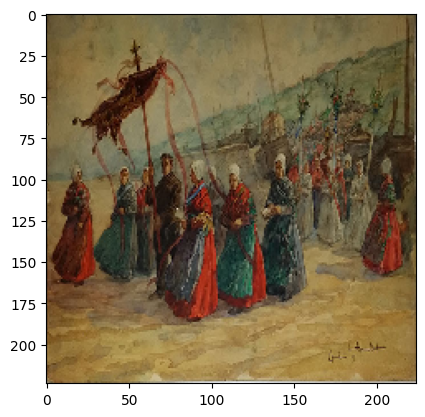

-----------------------------------------------------------------------
productos más similares:


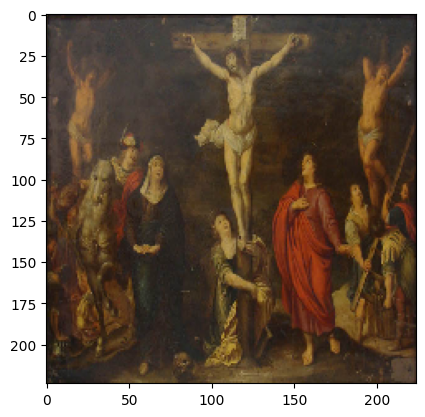

score de similaridad :  0.6438216


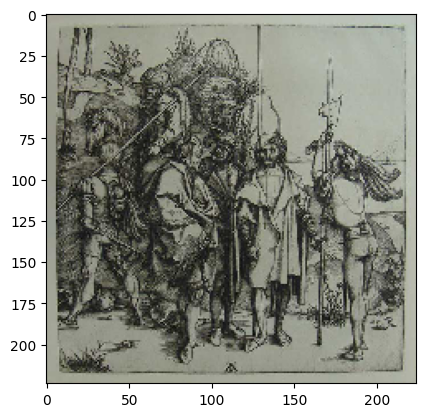

score de similaridad :  0.58517855


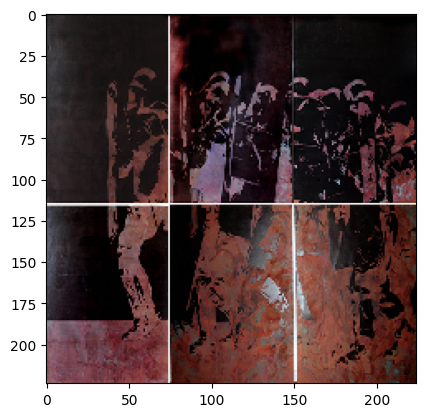

score de similaridad :  0.5802597


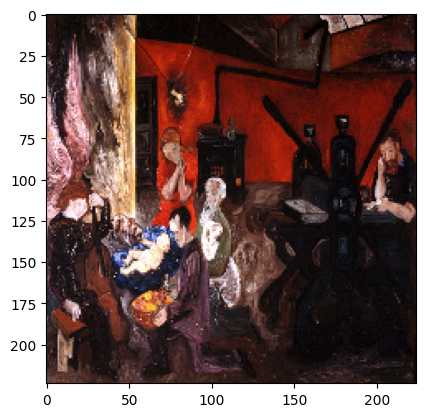

score de similaridad :  0.5368826


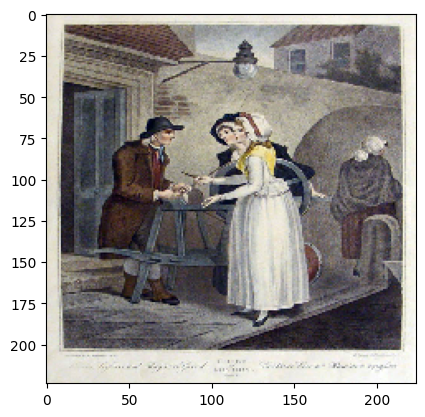

score de similaridad :  0.51868576


In [ ]:
idx = random.randint(0, len(files))
print(idx)
retrieve_most_similar_products(files[idx])

Ahora trabajaremos con un nuevo conjunto de imagenes.

Se trabajara con una base de datos generada por los autores, la cual consiste de las mejores postales de Ecuador.

In [ ]:
from IPython.display import clear_output

!unzip -o Ecuador_en_imagenes

clear_output() # Limpiar ventana para que no se vea despues.
!ls

Ecuador_en_imagenes  Ecuador_en_imagenes.zip  sample_data


In [ ]:
import os
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt

images = []
dataset = []
images_path = random.sample(os.listdir("Ecuador_en_imagenes"), 2)
for image in images_path:
  if image.endswith(".png"):
    image_file = cv2.imread(os.path.join("Ecuador_en_imagenes", image))
    resized = cv2.resize(image_file, (20, 30), interpolation = cv2.INTER_AREA)
    images.append(resized)

images_ec = np.array(images)

In [ ]:
# cargamos el modelo escoger

modelo_escogido = 'vgg16' #@param["vgg16", "vgg19"]

if modelo_escogido == 'vgg16':
  # cargar modelo
  vgg_model = vgg16.VGG16(weights='imagenet')
  # quitar la capa de clasificacion
  feat_extractor = Model(inputs=vgg_model.input, outputs=vgg_model.get_layer("fc2").output)
  # vemos resumen de la arquitectura del modelo
  feat_extractor.summary()

elif modelo_escogido == 'vgg19':
  # cargar modelo
  vgg19_model = vgg19.VGG19(weights='imagenet')
  # quitar la capa de clasificacion
  feat_extractor = Model(inputs=vgg19_model.input, outputs=vgg19_model.get_layer("fc2").output)
  # vemos resumen de la arquitectura del modelo
  feat_extractor.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0   

In [ ]:
imgs_path = "Ecuador_en_imagenes/" # ruta

In [ ]:
files = [imgs_path + x for x in os.listdir(imgs_path) if "png" in x]
print("total de imagenes:",len(files))

total de imagenes: 52


In [ ]:
imgs_model_width, imgs_model_height = 224, 224 # tamaño de las imagenes 224x224 pixeles

nb_closest_images = 5

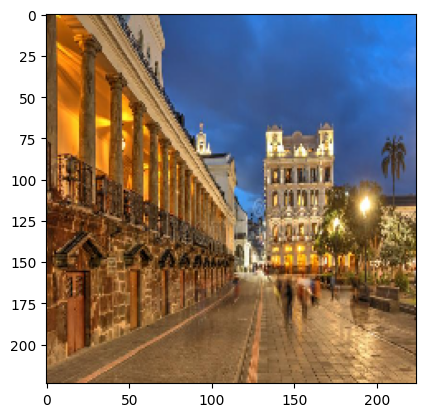

image cargada exitosamente!


In [ ]:
#Imagen aleatoria
import random

idx = random.randint(0, len(files))
original = load_img(files[idx], target_size=(imgs_model_width, imgs_model_height))
plt.imshow(original)
plt.show()
print("image cargada exitosamente!")

In [ ]:
numpy_image = img_to_array(original)

# convertir imagen a batch de imagenes para entrenamiento más eficiente
image_batch = np.expand_dims(numpy_image, axis=0)
print('image batch size', image_batch.shape)

# preparamos la imagen para la VGG16
processed_image = preprocess_input(image_batch.copy())

image batch size (1, 224, 224, 3)


In [ ]:
# obtenemos los features (embeddings) de las imagenes pasandolas por la VGG16
img_features = feat_extractor.predict(processed_image)

print("features successfully extracted!")
print("number of image features:",img_features.size)
img_features

1/1 [==============================] - 1s 723ms/step
features successfully extracted!
number of image features: 4096


array([[0.       , 1.8702673, 0.4886448, ..., 0.       , 0.       ,
        0.       ]], dtype=float32)

In [ ]:
# repetimos el mismo proceso para todas las imagenes y guardamos los batch en una lista para entregarselos procesados a la VGG16
importedImages = []

for f in files:
    filename = f
    original = load_img(filename, target_size=(224, 224))
    numpy_image = img_to_array(original)
    image_batch = np.expand_dims(numpy_image, axis=0)

    importedImages.append(image_batch)

images = np.vstack(importedImages)

processed_imgs = preprocess_input(images.copy())

In [ ]:
# obtenemos los features para cada imagen con la CNN
imgs_features = feat_extractor.predict(processed_imgs)

print("features extraidos exitosamente!")
imgs_features.shape

2/2 [==============================] - 14s 3s/step
features extraidos exitosamente!


(52, 4096)

In [ ]:
# computa similaridad coseno entre los features de las imagenes
cosSimilarities = cosine_similarity(imgs_features)

# guardamos los resultados en un dataframe
cos_similarities_df = pd.DataFrame(cosSimilarities, columns=files, index=files)
cos_similarities_df #.head()

,Ecuador_en_imagenes/Man.png,Ecuador_en_imagenes/Qui8.png,Ecuador_en_imagenes/Qui11.png,Ecuador_en_imagenes/Guay3.png,Ecuador_en_imagenes/Guay2.png,Ecuador_en_imagenes/Guay1.png,Ecuador_en_imagenes/Mac1.png,Ecuador_en_imagenes/Gal5.png,Ecuador_en_imagenes/Cue4.png,Ecuador_en_imagenes/Guay4.png,...,Ecuador_en_imagenes/Qui2.png,Ecuador_en_imagenes/Guay6.png,Ecuador_en_imagenes/Rio3.png,Ecuador_en_imagenes/Qui9.png,Ecuador_en_imagenes/Rio2.png,Ecuador_en_imagenes/Guay5.png,Ecuador_en_imagenes/Yas2.png,Ecuador_en_imagenes/Qui10.png,Ecuador_en_imagenes/Rio1.png,Ecuador_en_imagenes/Man3.png
Ecuador_en_imagenes/Man.png,1.000000,0.324077,0.280051,0.482583,0.446367,0.331767,0.424422,0.350318,0.318973,0.323454,...,0.331756,0.333029,0.345615,0.306893,0.290054,0.419091,0.414052,0.136533,0.440029,0.354512
Ecuador_en_imagenes/Qui8.png,0.324077,1.000000,0.222824,0.444238,0.405635,0.364114,0.451451,0.426202,0.342505,0.261379,...,0.675395,0.385879,0.439267,0.315409,0.316599,0.331600,0.448620,0.177775,0.643227,0.355140
Ecuador_en_imagenes/Qui11.png,0.280051,0.222824,1.000000,0.276222,0.408704,0.375125,0.377344,0.229583,0.366219,0.341038,...,0.203446,0.383802,0.351900,0.304577,0.247428,0.260860,0.250367,0.531609,0.307001,0.458015
Ecuador_en_imagenes/Guay3.png,0.482583,0.444238,0.276222,1.000000,0.525036,0.536560,0.550014,0.342555,0.519660,0.461699,...,0.385562,0.517635,0.411161,0.363304,0.460572,0.549205,0.550774,0.236264,0.547814,0.415817
Ecuador_en_imagenes/Guay2.png,0.446367,0.405635,0.408704,0.525036,1.000000,0.617657,0.523988,0.292579,0.505161,0.540814,...,0.383792,0.611035,0.433854,0.345203,0.376426,0.455435,0.478803,0.265274,0.492664,0.490574
Ecuador_en_imagenes/Guay1.png,0.331767,0.364114,0.375125,0.536560,0.617657,1.000000,0.422881,0.378832,0.454281,0.501150,...,0.335061,0.523190,0.410642,0.326024,0.312087,0.404963,0.445872,0.295896,0.464769,0.537461
Ecuador_en_imagenes/Mac1.png,0.424422,0.451451,0.377344,0.550014,0.523988,0.422881,1.000000,0.243703,0.396268,0.375696,...,0.322567,0.605119,0.456990,0.413223,0.449516,0.441976,0.459900,0.312536,0.515663,0.425620
Ecuador_en_imagenes/Gal5.png,0.350318,0.426202,0.229583,0.342555,0.292579,0.378832,0.243703,1.000000,0.287885,0.268652,...,0.571816,0.229880,0.363592,0.352948,0.234135,0.279087,0.388173,0.152864,0.487811,0.307781
Ecuador_en_imagenes/Cue4.png,0.318973,0.342505,0.366219,0.519660,0.505161,0.454281,0.396268,0.287885,1.000000,0.408424,...,0.415098,0.422422,0.326061,0.381816,0.387858,0.406239,0.422365,0.273322,0.470968,0.466269
Ecuador_en_imagenes/Guay4.png,0.323454,0.261379,0.341038,0.461699,0.540814,0.501150,0.375696,0.268652,0.408424,1.000000,...,0.232284,0.575465,0.497235,0.450857,0.377030,0.581374,0.447837,0.263944,0.436104,0.513593


In [ ]:
# esta funcion recupera las imagenes más similares dada una imagen entregada por el usuario
def retrieve_most_similar_products(given_img):

    print("-----------------------------------------------------------------------")
    print("producto escogido:")

    original = load_img(given_img, target_size=(imgs_model_width, imgs_model_height))
    plt.imshow(original)
    plt.show()

    print("-----------------------------------------------------------------------")
    print("productos más similares:")

    closest_imgs = cos_similarities_df[given_img].sort_values(ascending=False)[1:nb_closest_images+1].index
    closest_imgs_scores = cos_similarities_df[given_img].sort_values(ascending=False)[1:nb_closest_images+1]

    for i in range(0,len(closest_imgs)):
        original = load_img(closest_imgs[i], target_size=(imgs_model_width, imgs_model_height))
        plt.imshow(original)
        plt.show()
        print("score de similaridad : ",closest_imgs_scores[i])

21
-----------------------------------------------------------------------
producto escogido:


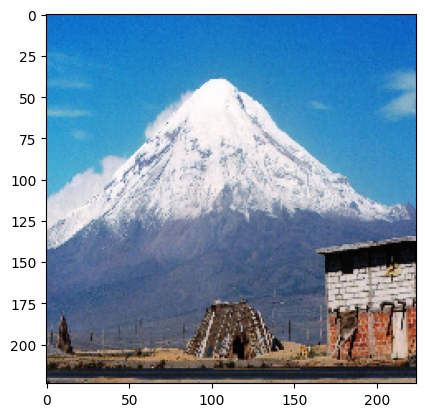

-----------------------------------------------------------------------
productos más similares:


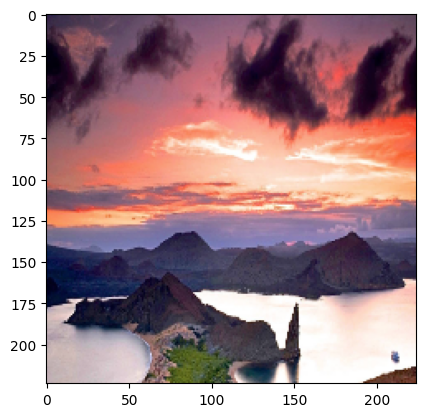

score de similaridad :  0.6764297


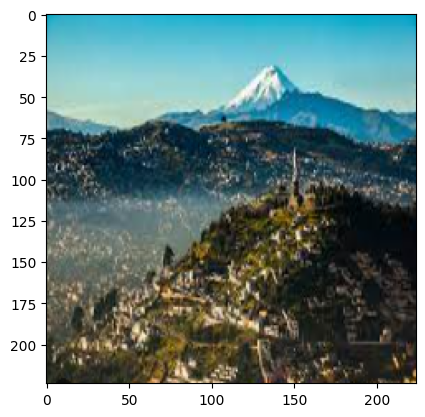

score de similaridad :  0.61527765


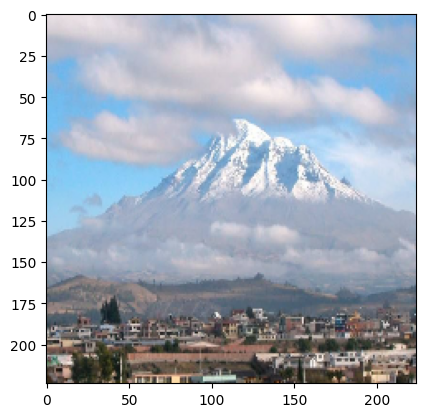

score de similaridad :  0.5879667


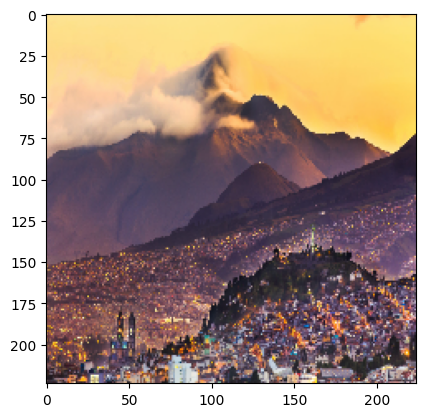

score de similaridad :  0.5775747


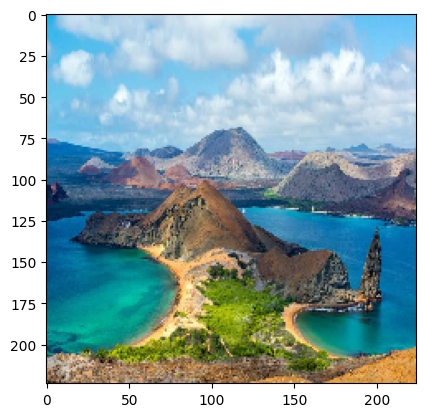

score de similaridad :  0.502725


In [ ]:
idx = random.randint(0, len(files))
print(idx)
retrieve_most_similar_products(files[idx])

Ahora trabajaremos con VGG19

In [ ]:
modelo_escogido = 'vgg19' #@param["vgg16", "vgg19"]

if modelo_escogido == 'vgg16':
  # cargar modelo
  vgg_model = vgg16.VGG16(weights='imagenet')
  # quitar la capa de clasificacion
  feat_extractor = Model(inputs=vgg_model.input, outputs=vgg_model.get_layer("fc2").output)
  # vemos resumen de la arquitectura del modelo
  feat_extractor.summary()

elif modelo_escogido == 'vgg19':
  # cargar modelo
  vgg19_model = vgg19.VGG19(weights='imagenet')
  # quitar la capa de clasificacion
  feat_extractor = Model(inputs=vgg19_model.input, outputs=vgg19_model.get_layer("fc2").output)
  # vemos resumen de la arquitectura del modelo
  feat_extractor.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0   

In [ ]:
import os
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt

images = []
dataset = []
images_path = random.sample(os.listdir("Ecuador_en_imagenes"), 2)
for image in images_path:
  if image.endswith(".png"):
    image_file = cv2.imread(os.path.join("Ecuador_en_imagenes", image))
    resized = cv2.resize(image_file, (20, 30), interpolation = cv2.INTER_AREA)
    images.append(resized)

images_ec = np.array(images)

In [ ]:
imgs_path = "Ecuador_en_imagenes/" # ruta

In [ ]:
files = [imgs_path + x for x in os.listdir(imgs_path) if "png" in x]
print("total de imagenes:",len(files))

total de imagenes: 52


In [ ]:
imgs_model_width, imgs_model_height = 224, 224 # tamaño de las imagenes 224x224 pixeles

nb_closest_images = 5

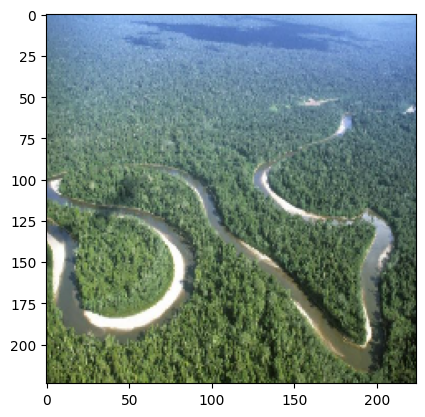

image cargada exitosamente!


In [ ]:
#Imagen aleatoria
import random

idx = random.randint(0, len(files))
original = load_img(files[idx], target_size=(imgs_model_width, imgs_model_height))
plt.imshow(original)
plt.show()
print("image cargada exitosamente!")

In [ ]:
# convertir PIL image a numpy array
numpy_image = img_to_array(original)

# convertir imagen a batch de imagenes para entrenamiento más eficiente
image_batch = np.expand_dims(numpy_image, axis=0)
print('image batch size', image_batch.shape)

# preparamos la imagen para la VGG16
processed_image = preprocess_input(image_batch.copy())

image batch size (1, 224, 224, 3)


In [ ]:
# obtenemos los features (embeddings) de las imagenes pasandolas por la VGG16
img_features = feat_extractor.predict(processed_image)

print("features successfully extracted!")
print("number of image features:",img_features.size)
img_features

1/1 [==============================] - 0s 150ms/step
features successfully extracted!
number of image features: 4096


array([[0.       , 2.9825594, 0.       , ..., 2.0901394, 0.       ,
        0.       ]], dtype=float32)

In [ ]:
# repetimos el mismo proceso para todas las imagenes y guardamos los batch en una lista para entregarselos procesados a la VGG16
importedImages = []

for f in files:
    filename = f
    original = load_img(filename, target_size=(224, 224))
    numpy_image = img_to_array(original)
    image_batch = np.expand_dims(numpy_image, axis=0)

    importedImages.append(image_batch)

images = np.vstack(importedImages)

processed_imgs = preprocess_input(images.copy())

In [ ]:
# obtenemos los features para cada imagen con la CNN
imgs_features = feat_extractor.predict(processed_imgs)

print("features extraidos exitosamente!")
imgs_features.shape

2/2 [==============================] - 0s 181ms/step
features extraidos exitosamente!


(52, 4096)

In [ ]:
# computa similaridad coseno entre los features de las imagenes
cosSimilarities = cosine_similarity(imgs_features)

# guardamos los resultados en un dataframe
cos_similarities_df = pd.DataFrame(cosSimilarities, columns=files, index=files)
cos_similarities_df #.head()

,Ecuador_en_imagenes/Man.png,Ecuador_en_imagenes/Qui8.png,Ecuador_en_imagenes/Qui11.png,Ecuador_en_imagenes/Guay3.png,Ecuador_en_imagenes/Guay2.png,Ecuador_en_imagenes/Guay1.png,Ecuador_en_imagenes/Mac1.png,Ecuador_en_imagenes/Gal5.png,Ecuador_en_imagenes/Cue4.png,Ecuador_en_imagenes/Guay4.png,...,Ecuador_en_imagenes/Qui2.png,Ecuador_en_imagenes/Guay6.png,Ecuador_en_imagenes/Rio3.png,Ecuador_en_imagenes/Qui9.png,Ecuador_en_imagenes/Rio2.png,Ecuador_en_imagenes/Guay5.png,Ecuador_en_imagenes/Yas2.png,Ecuador_en_imagenes/Qui10.png,Ecuador_en_imagenes/Rio1.png,Ecuador_en_imagenes/Man3.png
Ecuador_en_imagenes/Man.png,1.000000,0.322560,0.243150,0.486459,0.520491,0.290178,0.441776,0.322852,0.305452,0.294620,...,0.382685,0.360151,0.327545,0.253453,0.303626,0.434791,0.406943,0.123272,0.356212,0.297431
Ecuador_en_imagenes/Qui8.png,0.322560,1.000000,0.271648,0.539987,0.412790,0.341021,0.460768,0.495439,0.339598,0.332879,...,0.690000,0.357013,0.350398,0.377424,0.317612,0.384524,0.494567,0.216068,0.665533,0.338781
Ecuador_en_imagenes/Qui11.png,0.243150,0.271648,1.000000,0.336118,0.390337,0.412848,0.348484,0.272433,0.403626,0.412977,...,0.254412,0.329168,0.306321,0.265513,0.228629,0.296262,0.267531,0.586731,0.289111,0.444842
Ecuador_en_imagenes/Guay3.png,0.486459,0.539987,0.336118,1.000000,0.578009,0.443214,0.597721,0.404408,0.425676,0.464473,...,0.472272,0.557358,0.458215,0.421667,0.458898,0.510285,0.517962,0.284190,0.513412,0.415909
Ecuador_en_imagenes/Guay2.png,0.520491,0.412790,0.390337,0.578009,1.000000,0.524323,0.494897,0.334426,0.507232,0.631091,...,0.369692,0.640115,0.385727,0.332565,0.405060,0.450540,0.449556,0.239314,0.439423,0.426689
Ecuador_en_imagenes/Guay1.png,0.290178,0.341021,0.412848,0.443214,0.524323,1.000000,0.355292,0.325179,0.450078,0.519099,...,0.335156,0.450860,0.307514,0.298926,0.318286,0.375474,0.417719,0.291310,0.410122,0.492589
Ecuador_en_imagenes/Mac1.png,0.441776,0.460768,0.348484,0.597721,0.494897,0.355292,1.000000,0.307934,0.377766,0.401655,...,0.362282,0.488912,0.372246,0.364460,0.383029,0.374855,0.422262,0.263439,0.411736,0.380436
Ecuador_en_imagenes/Gal5.png,0.322852,0.495439,0.272433,0.404408,0.334426,0.325179,0.307934,1.000000,0.286082,0.299645,...,0.628391,0.271358,0.382452,0.439719,0.256274,0.359032,0.449643,0.164916,0.549819,0.263427
Ecuador_en_imagenes/Cue4.png,0.305452,0.339598,0.403626,0.425676,0.507232,0.450078,0.377766,0.286082,1.000000,0.533562,...,0.339363,0.439365,0.312379,0.390732,0.409134,0.400082,0.430313,0.360879,0.388909,0.514294
Ecuador_en_imagenes/Guay4.png,0.294620,0.332879,0.412977,0.464473,0.631091,0.519099,0.401655,0.299645,0.533562,1.000000,...,0.296003,0.591820,0.417296,0.358164,0.367232,0.461286,0.421060,0.307049,0.403188,0.484328


In [ ]:
# esta funcion recupera las imagenes más similares dada una imagen entregada por el usuario
def retrieve_most_similar_products(given_img):

    print("-----------------------------------------------------------------------")
    print("producto escogido:")

    original = load_img(given_img, target_size=(imgs_model_width, imgs_model_height))
    plt.imshow(original)
    plt.show()

    print("-----------------------------------------------------------------------")
    print("productos más similares:")

    closest_imgs = cos_similarities_df[given_img].sort_values(ascending=False)[1:nb_closest_images+1].index
    closest_imgs_scores = cos_similarities_df[given_img].sort_values(ascending=False)[1:nb_closest_images+1]

    for i in range(0,len(closest_imgs)):
        original = load_img(closest_imgs[i], target_size=(imgs_model_width, imgs_model_height))
        plt.imshow(original)
        plt.show()
        print("score de similaridad : ",closest_imgs_scores[i])

32
-----------------------------------------------------------------------
producto escogido:


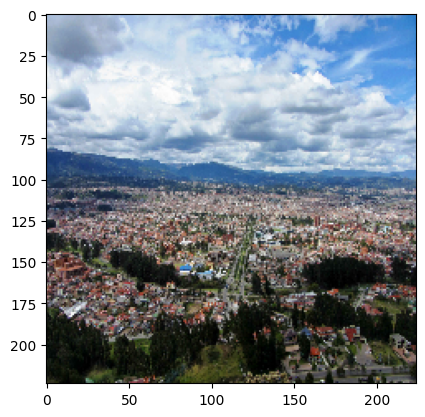

-----------------------------------------------------------------------
productos más similares:


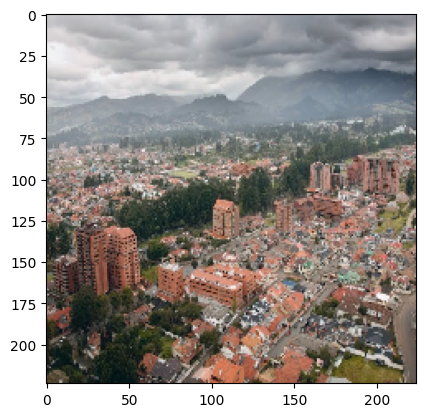

score de similaridad :  0.73776466


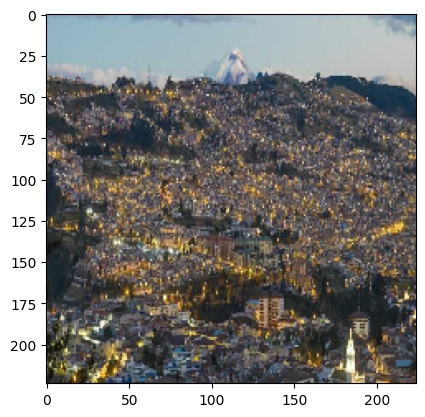

score de similaridad :  0.67392373


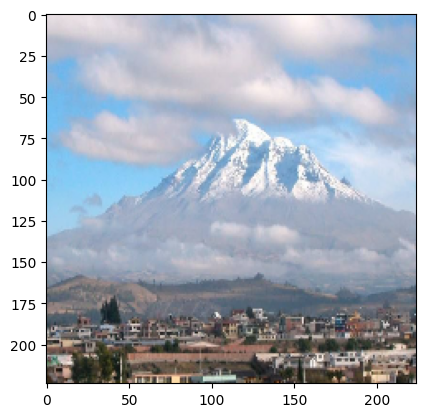

score de similaridad :  0.65169793


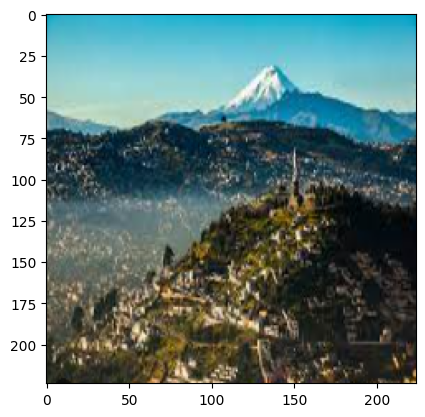

score de similaridad :  0.62952083


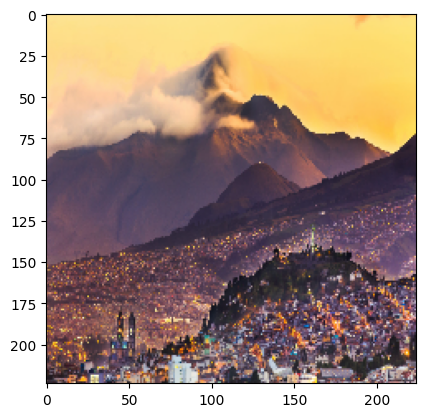

score de similaridad :  0.59223074


In [ ]:
idx = random.randint(0, len(files))
print(idx)
retrieve_most_similar_products(files[idx])

Actividad 2.
**A) En el primer ejercicio vemos que, con la arquitectura vgg19 tenemos un total de 147584 parametros despues de la quinta capa entrenable. Mientras que con la arquitectura vgg16 tenemos 147584.
El total de parametros en el primer caso es de 139,570,240 , y en el segundo 134,260,544.**
** B) En el segundo caso tenemos con la arquitectura vgg16 un total de 147584  en la quinta capa, y en con la segunda arquitectura (vgg190) nos queda la misma cantidad.
139,570,240 parametros totales para la vgg19 y 134,260,544 para la vgg16.**